In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import os

In [2]:
data_path = os.path.join(os.pardir, 'data')

In [3]:
crop_path = os.path.join(data_path, "Cleaned Data/Crop_sesonal.csv")
soil_path = os.path.join(data_path, "Cleaned Data/soil_final.csv")

In [4]:
crop_data = pd.read_csv(crop_path)
soil_data = pd.read_csv(soil_path)

In [5]:
crop_data.head()

,district,year,Season,Area (Hectare),Production (Tonnes),Yield (Tonnes/Hectare),Crop,State,mean_temperature_2m_mean (Â°C)_seasonal,mean_relative_humidity_2m (%)_seasonal,mean_temperature_2m_max (Â°C)_seasonal,mean_soil_temperature_0_to_7cm (Â°C)_seasonal,mean_temperature_2m_min (Â°C)_seasonal,mean_soil_moisture_0_to_7cm (mÂ³/mÂ³)_seasonal,mean_wind_speed_10m_max (km/h)_seasonal,mean_rain_sum (mm)_seasonal
0,24 paraganas north,1997,Whole Year,1345.0,1274.0,0.947212,Arecanut,West Bengal,25.332407,77.510488,29.934613,26.727149,21.621957,0.282786,12.339231,5.097360
1,24 paraganas north,1997,Whole Year,45.0,40.0,0.888889,Arhar/Tur,West Bengal,25.332407,77.510488,29.934613,26.727149,21.621957,0.282786,12.339231,5.097360
2,24 paraganas north,1997,Whole Year,2975.0,40162500.0,13500.000000,Coconut,West Bengal,25.332407,77.510488,29.934613,26.727149,21.621957,0.282786,12.339231,5.097360
3,24 paraganas north,1997,Whole Year,3916.0,7706.0,1.967824,Dry chillies,West Bengal,25.332407,77.510488,29.934613,26.727149,21.621957,0.282786,12.339231,5.097360
4,24 paraganas north,1997,Winter,267.0,160.0,0.599251,Gram,West Bengal,22.572476,71.047353,27.968056,24.248702,17.768949,0.203086,10.390048,0.955894


In [6]:
soil_data.head()

,Dist_Code,State_Code,State_Name,Dist_Name,SOIL_TYPE_PERCENT_(Percent),ORTHIDS,UDUPTS/UDALFS,USTALF/USTOLLS,INCEPTISOLS
0,803,13,West Bengal,nadia,ORTHIDS - 100%,100.0,NaN,NaN,NaN
1,804,13,West Bengal,murshidabad,UDUPTS/UDALFS - 80% ; ORTHIDS - 20%,20.0,80.0,NaN,NaN
2,806,13,West Bengal,birbhum,UDUPTS/UDALFS - 100%,NaN,100.0,NaN,NaN
3,807,13,West Bengal,bankura,USTALF/USTOLLS - 50% ; UDUPTS/UDALFS - 50%,NaN,50.0,50.0,NaN
4,810,13,West Bengal,hooghly,ORTHIDS - 85% ; UDUPTS/UDALFS - 15%,85.0,15.0,NaN,NaN


In [7]:
crop_data.drop(columns=['State'],inplace=True)

In [8]:
crop_data.rename(columns={'Area (Hectare)':'area',
                          'Production (Tonnes)':'production',
                          'Yield (Tonnes/Hectare)':'yield',
                          'mean_temperature_2m_mean (Â°C)_seasonal':'mean_temperature',
                          'mean_relative_humidity_2m (%)_seasonal':'mean_relative_humidity',
                          'mean_temperature_2m_max (Â°C)_seasonal':'max_temperature',
                          'mean_soil_temperature_0_to_7cm (Â°C)_seasonal':'soil_temperature',
                          'mean_temperature_2m_min (Â°C)_seasonal':'min_temperature',
                          'mean_soil_moisture_0_to_7cm (mÂ³/mÂ³)_seasonal':'soil_moisture',
                          'mean_wind_speed_10m_max (km/h)_seasonal':'wind_speed',
                          'mean_rain_sum (mm)_seasonal':'rain_sum'},inplace=True)

In [9]:
soil_data.drop(columns=['State_Name','Dist_Code','State_Code','SOIL_TYPE_PERCENT_(Percent)'],inplace=True)

In [10]:
soil_data.rename(columns={'Dist_Name':'district'},inplace=True)

In [11]:
crop_data = pd.merge(crop_data,soil_data,on=['district'])

In [12]:
crop_data.columns = crop_data.columns.str.lower()

In [13]:
crop_data.head()

,district,year,season,area,production,yield,crop,mean_temperature,mean_relative_humidity,max_temperature,soil_temperature,min_temperature,soil_moisture,wind_speed,rain_sum,orthids,udupts/udalfs,ustalf/ustolls,inceptisols
0,24 paraganas north,1997,Whole Year,1345.0,1274.0,0.947212,Arecanut,25.332407,77.510488,29.934613,26.727149,21.621957,0.282786,12.339231,5.097360,100.0,NaN,NaN,NaN
1,24 paraganas north,1997,Whole Year,45.0,40.0,0.888889,Arhar/Tur,25.332407,77.510488,29.934613,26.727149,21.621957,0.282786,12.339231,5.097360,100.0,NaN,NaN,NaN
2,24 paraganas north,1997,Whole Year,2975.0,40162500.0,13500.000000,Coconut,25.332407,77.510488,29.934613,26.727149,21.621957,0.282786,12.339231,5.097360,100.0,NaN,NaN,NaN
3,24 paraganas north,1997,Whole Year,3916.0,7706.0,1.967824,Dry chillies,25.332407,77.510488,29.934613,26.727149,21.621957,0.282786,12.339231,5.097360,100.0,NaN,NaN,NaN
4,24 paraganas north,1997,Winter,267.0,160.0,0.599251,Gram,22.572476,71.047353,27.968056,24.248702,17.768949,0.203086,10.390048,0.955894,100.0,NaN,NaN,NaN


In [14]:
crop_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12323 entries, 0 to 12322
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   district                12323 non-null  object 
 1   year                    12323 non-null  int64  
 2   season                  12323 non-null  object 
 3   area                    12323 non-null  float64
 4   production              12307 non-null  float64
 5   yield                   12323 non-null  float64
 6   crop                    12323 non-null  object 
 7   mean_temperature        12323 non-null  float64
 8   mean_relative_humidity  12323 non-null  float64
 9   max_temperature         12323 non-null  float64
 10  soil_temperature        12323 non-null  float64
 11  min_temperature         12323 non-null  float64
 12  soil_moisture           12323 non-null  float64
 13  wind_speed              12323 non-null  float64
 14  rain_sum                12323 non-null

In [15]:
crop_data['year'] = pd.to_datetime(crop_data['year'],format='%Y')

In [16]:
crop_data.isnull().sum()

district                      0
year                          0
season                        0
area                          0
production                   16
yield                         0
crop                          0
mean_temperature              0
mean_relative_humidity        0
max_temperature               0
soil_temperature              0
min_temperature               0
soil_moisture                 0
wind_speed                    0
rain_sum                      0
orthids                    7062
udupts/udalfs              7416
ustalf/ustolls            10008
inceptisols                7598
dtype: int64

In [17]:
crop_data = crop_data[crop_data['production'].isnull()==False]

In [18]:
crop_data.fillna(0,inplace=True)

In [19]:
crop_data.isnull().sum()

district                  0
year                      0
season                    0
area                      0
production                0
yield                     0
crop                      0
mean_temperature          0
mean_relative_humidity    0
max_temperature           0
soil_temperature          0
min_temperature           0
soil_moisture             0
wind_speed                0
rain_sum                  0
orthids                   0
udupts/udalfs             0
ustalf/ustolls            0
inceptisols               0
dtype: int64

In [20]:
crop_data.shape

(12307, 19)

In [21]:
crop_data.duplicated().sum()

0

In [22]:
crop_data.head()

,district,year,season,area,production,yield,crop,mean_temperature,mean_relative_humidity,max_temperature,soil_temperature,min_temperature,soil_moisture,wind_speed,rain_sum,orthids,udupts/udalfs,ustalf/ustolls,inceptisols
0,24 paraganas north,1997-01-01,Whole Year,1345.0,1274.0,0.947212,Arecanut,25.332407,77.510488,29.934613,26.727149,21.621957,0.282786,12.339231,5.097360,100.0,0.0,0.0,0.0
1,24 paraganas north,1997-01-01,Whole Year,45.0,40.0,0.888889,Arhar/Tur,25.332407,77.510488,29.934613,26.727149,21.621957,0.282786,12.339231,5.097360,100.0,0.0,0.0,0.0
2,24 paraganas north,1997-01-01,Whole Year,2975.0,40162500.0,13500.000000,Coconut,25.332407,77.510488,29.934613,26.727149,21.621957,0.282786,12.339231,5.097360,100.0,0.0,0.0,0.0
3,24 paraganas north,1997-01-01,Whole Year,3916.0,7706.0,1.967824,Dry chillies,25.332407,77.510488,29.934613,26.727149,21.621957,0.282786,12.339231,5.097360,100.0,0.0,0.0,0.0
4,24 paraganas north,1997-01-01,Winter,267.0,160.0,0.599251,Gram,22.572476,71.047353,27.968056,24.248702,17.768949,0.203086,10.390048,0.955894,100.0,0.0,0.0,0.0


## Univariate Analysis

In [23]:
crop_data.describe()

,area,production,yield,mean_temperature,mean_relative_humidity,max_temperature,soil_temperature,min_temperature,soil_moisture,wind_speed,rain_sum,orthids,udupts/udalfs,ustalf/ustolls,inceptisols
count,1.230700e+04,1.230700e+04,12307.000000,12307.000000,12307.000000,12307.000000,12307.000000,12307.000000,12307.000000,12307.000000,12307.000000,12307.000000,12307.000000,12307.000000,12307.000000
mean,1.919328e+04,7.220320e+05,427.808003,24.208839,75.618878,28.916575,25.415222,20.268081,0.290954,11.539002,5.153515,32.042740,23.805964,12.143496,32.007800
std,1.431930e+05,4.937430e+06,2357.925025,4.197426,7.950642,4.023378,4.337664,4.768029,0.080226,2.434820,4.810882,43.543007,33.599029,27.770879,42.353453
min,1.000000e+00,7.040000e-01,0.002618,7.617222,50.054029,12.076546,7.001231,3.670055,0.163724,5.244565,0.218164,0.000000,0.000000,0.000000,0.000000
25%,1.090000e+02,9.800000e+01,0.682267,22.188442,69.234461,27.865580,23.545546,16.964903,0.218885,10.182471,1.232391,0.000000,0.000000,0.000000,0.000000
50%,5.980000e+02,8.400000e+02,1.200000,24.414130,74.733962,29.187912,25.573976,20.414154,0.277311,11.229034,3.889493,0.000000,0.000000,0.000000,0.000000
75%,4.672500e+03,1.749900e+04,2.715271,27.497826,83.419156,30.848009,28.421649,25.106522,0.377569,12.903261,7.779710,100.000000,50.000000,0.000000,60.000000
max,8.580100e+06,7.509500e+07,38800.000000,32.156044,94.375906,38.731868,34.473443,28.219780,0.496208,21.109890,26.207609,100.000000,100.000000,100.000000,100.000000


In [27]:
numerical_columns = ['area','production','yield','mean_temperature','mean_relative_humidity',
                     'max_temperature','soil_temperature','min_temperature'
                     ,'soil_moisture','wind_speed','rain_sum','orthids','udupts/udalfs','ustalf/ustolls','inceptisols']

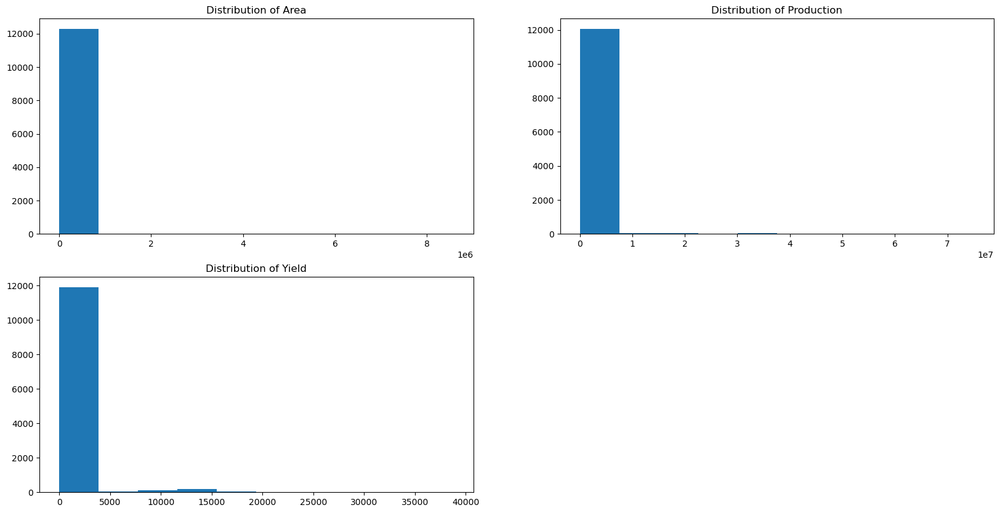

In [25]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
axes[0,0].hist(crop_data['area'])
axes[0,0].set_title("Distribution of Area")
axes[0,1].hist(crop_data['production'])
axes[0,1].set_title("Distribution of Production")
axes[1,0].hist(crop_data['yield'])
axes[1,0].set_title("Distribution of Yield")
fig.delaxes(axes[1, 1]) 
plt.show()

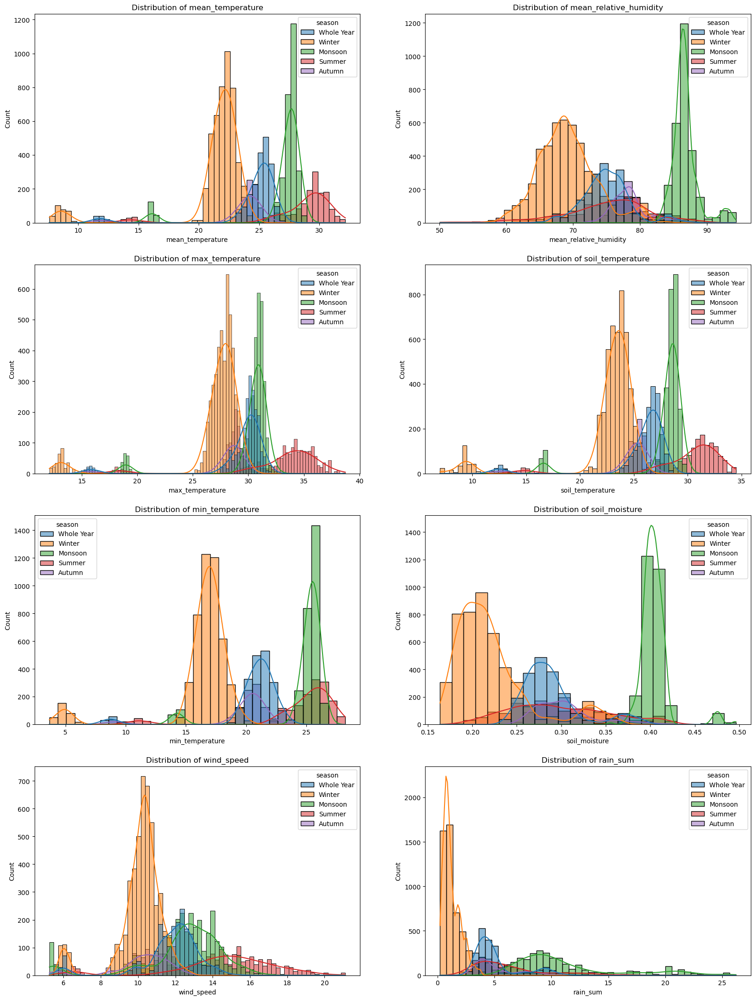

In [28]:
#distribution of the weather parameters
fig, axes = plt.subplots(4, 2, figsize=(20, 27))
axes_flat = axes.flatten()

for idx, column in enumerate(numerical_columns[3:-4]):
    sns.histplot(data=crop_data, x=column, kde=True, ax=axes_flat[idx],hue='season')
    axes_flat[idx].set_title(f'Distribution of {column}')

#plt.tight_layout()
plt.show()

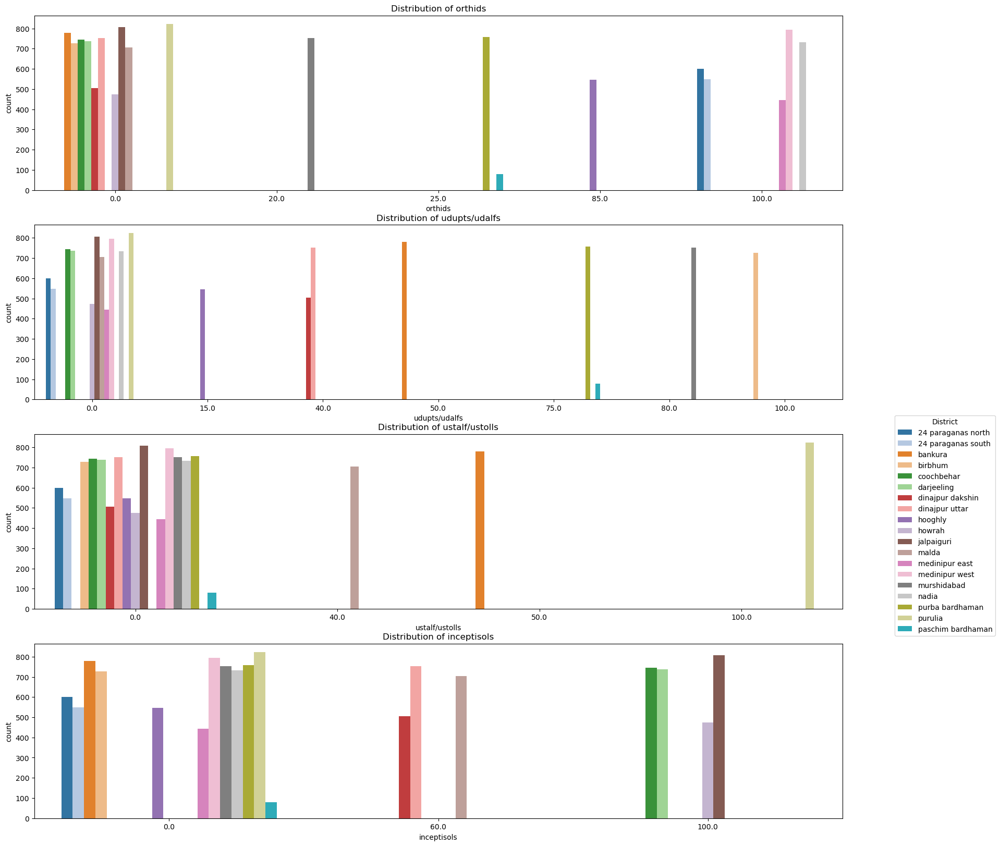

In [29]:
fig, axes = plt.subplots(4, 1, figsize=(20, 20))
axes_flat = axes.flatten()

for idx, column in enumerate(numerical_columns[-4:]):
    sns.countplot(data=crop_data, x=column, ax=axes_flat[idx],hue='district',palette='tab20')
    axes_flat[idx].set_title(f'Distribution of {column}')
    axes_flat[idx].legend_.remove()
    
handles, labels = axes_flat[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', title='District', bbox_to_anchor=(1.05, 0.5), bbox_transform=plt.gcf().transFigure)


#plt.tight_layout()
plt.show()

In [30]:
skewness = crop_data[numerical_columns].skew()
kurtosis = crop_data[numerical_columns].kurt()

results = {
    'skewness':skewness,
    'kurtosis':kurtosis
}

skew_kurt = pd.DataFrame(results)
skew_kurt

,skewness,kurtosis
area,34.794533,1576.743044
production,9.261509,93.578618
yield,5.878870,36.709361
mean_temperature,-1.485979,3.632258
mean_relative_humidity,0.168191,-0.912110
max_temperature,-1.931370,5.815234
soil_temperature,-1.534003,4.028804
min_temperature,-0.772740,0.953721
soil_moisture,0.305955,-1.201787
wind_speed,0.122913,1.015532


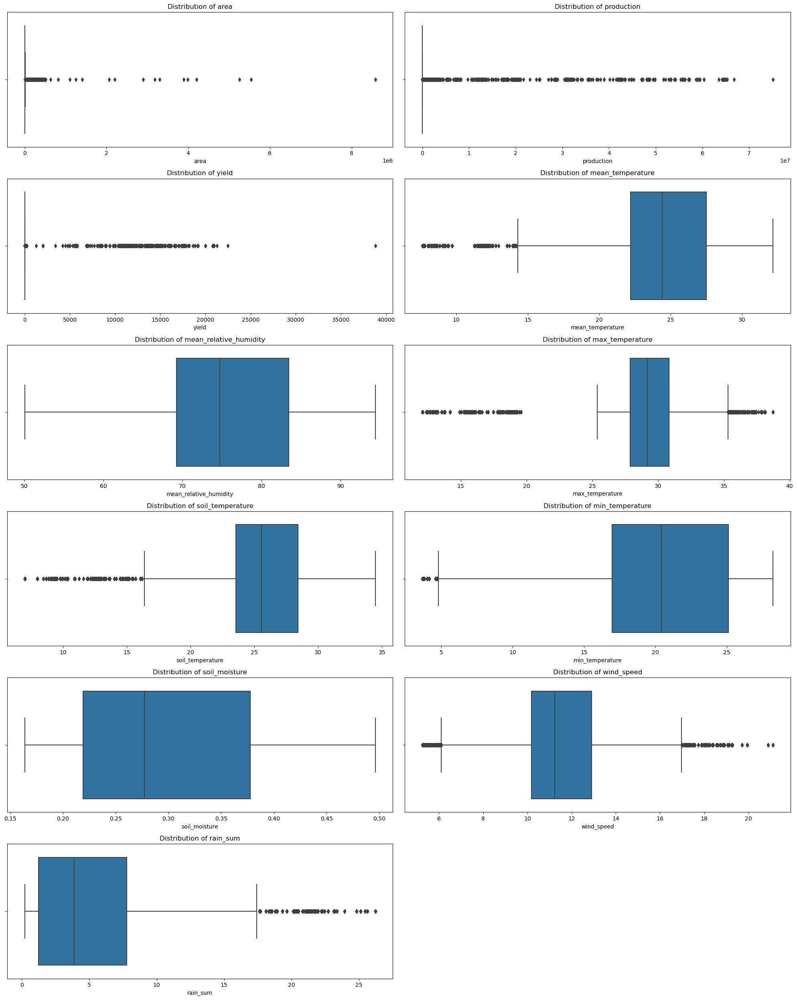

In [31]:
fig, axes = plt.subplots(6, 2, figsize=(20, 25))
axes_flat = axes.flatten()

for idx, column in enumerate(numerical_columns[:-4]): 
    sns.boxplot(data=crop_data, x=column, ax=axes_flat[idx]) 
    axes_flat[idx].set_title(f'Distribution of {column}')
    
fig.delaxes(axes_flat[11]) 

plt.tight_layout() 
plt.show()


In [32]:
crop_data['district'].value_counts()

purulia               823
jalpaiguri            807
medinipur west        795
bankura               779
purba bardhaman       757
dinajpur uttar        752
murshidabad           752
coochbehar            744
darjeeling            737
nadia                 733
birbhum               727
malda                 705
24 paraganas north    600
24 paraganas south    548
hooghly               546
dinajpur dakshin      505
howrah                474
medinipur east        444
paschim bardhaman      79
Name: district, dtype: int64

In [33]:
crop_data['season'].value_counts()

Winter        4936
Monsoon       2848
Whole Year    2032
Summer        1572
Autumn         919
Name: season, dtype: int64

In [34]:
crop_data['crop'].value_counts()

Rice                     1251
Moong(Green Gram)         808
Groundnut                 717
Maize                     694
Sesamum                   675
Urad                      631
Potato                    431
Coconut                   417
Rapeseed &Mustard         416
Wheat                     413
Masoor                    398
Jute                      391
Khesari                   379
Sugarcane                 360
Peas & beans (Pulses)     349
Linseed                   317
Gram                      316
Sunflower                 283
Arhar/Tur                 275
Mesta                     269
Dry chillies              252
Horse-gram                226
Turmeric                  216
Ginger                    196
Arecanut                  188
Small millets             168
Sannhamp                  166
Niger seed                156
Barley                    147
Other Kharif pulses       116
Safflower                 113
Ragi                      108
Tobacco                    97
Soyabean  

## Bivariate Analysis

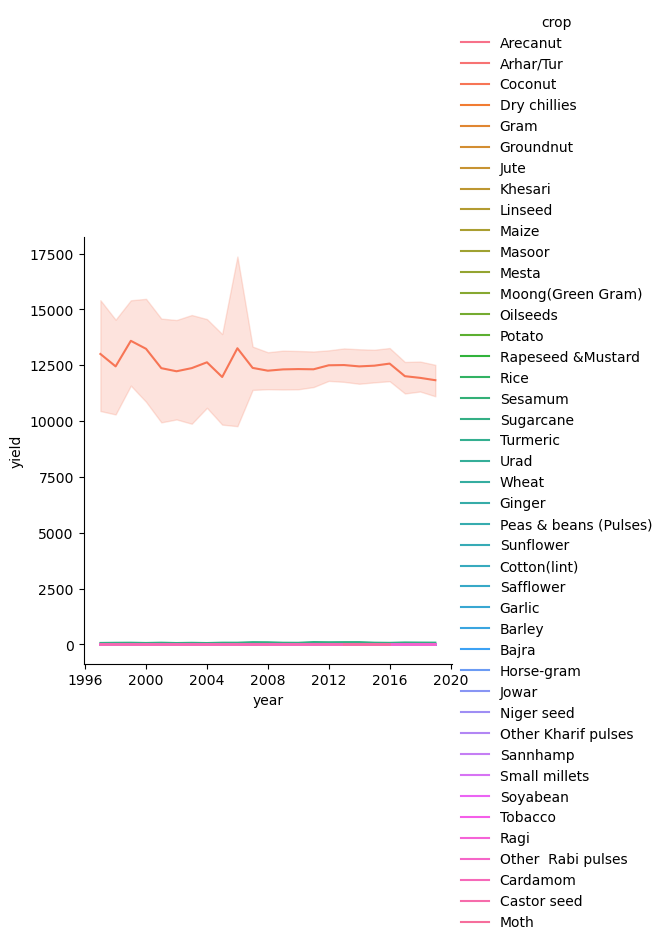

In [35]:
sns.relplot(data=crop_data,x='year',y='yield',hue='crop',kind='line')

In [36]:
px.scatter(crop_data,x='year',y='production',color='crop')

In [37]:
px.scatter(crop_data,x='area',y='production',color='crop')

In [38]:
px.scatter(crop_data,x='mean_temperature',y='production',color='crop')

In [44]:
px.scatter(crop_data,x='max_temperature',y='production',color='crop')

In [45]:
px.scatter(crop_data,x='min_temperature',y='production',color='crop')

In [39]:
px.scatter(crop_data,x='mean_relative_humidity',y='production',color='crop')

In [40]:
px.scatter(crop_data,x='wind_speed',y='production',color='crop')

In [41]:
px.scatter(crop_data,x='rain_sum',y='production',color='crop')

In [42]:
px.scatter(crop_data,x='soil_temperature',y='production',color='crop')

In [43]:
px.scatter(crop_data,x='soil_moisture',y='production',color='crop')

In [56]:
for crop in crop_data['crop'].unique():
    

Arecanut
Arhar/Tur
Coconut
Dry chillies
Gram
Groundnut
Jute
Khesari
Linseed
Maize
Masoor
Mesta
Moong(Green Gram)
Oilseeds
Potato
Rapeseed &Mustard
Rice
Sesamum
Sugarcane
Turmeric
Urad
Wheat
Ginger
Peas & beans (Pulses)
Sunflower
Cotton(lint)
Safflower
Garlic
Barley
Bajra
Horse-gram
Jowar
Niger seed
Other Kharif pulses
Sannhamp
Small millets
Soyabean
Tobacco
Ragi
Other  Rabi pulses
Cardamom
Castor seed
Moth


In [63]:
temp = crop_data[crop_data['crop']=='Rice'].corr()['production']

In [64]:
row_data = {'crop': 'Rice'}
row_data.update(temp)

In [65]:
row_data

{'crop': 'Rice',
 'area': 0.9617347536522687,
 'production': 1.0,
 'yield': 0.30400835992133035,
 'mean_temperature': -0.004637333932474427,
 'mean_relative_humidity': -0.517997905822897,
 'max_temperature': 0.0867997780345917,
 'soil_temperature': 0.02165914431444507,
 'min_temperature': -0.10275371042530489,
 'soil_moisture': -0.5160033910507392,
 'wind_speed': 0.067644980621048,
 'rain_sum': -0.4605744232458791,
 'orthids': 0.1877652603335505,
 'udupts/udalfs': 0.21654882976462408,
 'ustalf/ustolls': -0.04011734820028431,
 'inceptisols': -0.34237911226757417}

In [67]:
correlation_df = pd.DataFrame(columns=['crop'])

# Calculate correlations for each crop
for crop in crop_data['crop'].unique():
    # Filter data for specific crop
    temp_df = crop_data[crop_data['crop'] == crop]
    
    # Calculate correlations with production
    correlations = temp_df.corr()['production'].drop('production')
    
    # Create a row with crop name and correlation values
    row_data = {'crop': crop}
    row_data.update(correlations)
    
    # Add to DataFrame
    correlation_df = correlation_df.append(row_data, ignore_index=True)

# Round the correlation values
correlation_df = correlation_df.round(3)

# Sort by crop name
correlation_df = correlation_df.sort_values('crop').reset_index(drop=True)

C:\Users\Jit Nandi\AppData\Local\Temp\ipykernel_21960\2014064135.py:16: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Jit Nandi\AppData\Local\Temp\ipykernel_21960\2014064135.py:16: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Jit Nandi\AppData\Local\Temp\ipykernel_21960\2014064135.py:16: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Jit Nandi\AppData\Local\Temp\ipykernel_21960\2014064135.py:16: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Jit Nandi\AppData\Local\Temp\ipykernel_21960\2014064135.py:16: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future ve

In [68]:
correlation_df

,crop,area,inceptisols,max_temperature,mean_relative_humidity,mean_temperature,min_temperature,orthids,rain_sum,soil_moisture,soil_temperature,udupts/udalfs,ustalf/ustolls,wind_speed,yield
0,Arecanut,0.924,0.172,0.009,0.012,0.012,0.014,-0.041,0.159,0.012,0.008,-0.127,-0.076,-0.026,0.199
1,Arhar/Tur,0.773,-0.225,0.121,-0.007,0.099,0.084,0.072,-0.055,0.052,0.098,0.108,0.067,0.157,0.349
2,Bajra,0.767,-0.070,0.145,0.100,0.135,0.105,0.092,-0.240,-0.071,-0.016,0.329,-0.259,-0.112,0.409
3,Barley,0.916,0.109,-0.061,0.109,-0.044,-0.026,-0.181,-0.028,-0.039,-0.031,-0.230,0.778,0.111,-0.010
4,Cardamom,0.441,NaN,0.517,-0.140,0.545,0.598,NaN,-0.045,-0.379,0.586,NaN,NaN,0.107,0.228
5,Castor seed,0.070,NaN,0.179,0.093,0.141,0.127,NaN,-0.011,0.101,0.145,NaN,NaN,0.131,0.527
6,Coconut,0.875,-0.322,0.266,0.190,0.321,0.391,0.552,-0.235,0.056,0.330,-0.050,-0.367,0.472,0.266
7,Cotton(lint),0.991,-0.089,-0.096,0.218,0.020,0.077,0.150,0.235,0.022,-0.029,-0.100,-0.051,-0.019,0.000
8,Dry chillies,0.771,-0.044,0.221,0.075,0.247,0.267,0.321,0.257,-0.014,0.250,-0.167,-0.274,0.310,0.558
9,Garlic,0.965,0.110,0.103,0.137,0.134,0.152,0.265,0.354,0.292,0.131,-0.327,-0.227,0.104,-0.146
